In [1]:
import pandas as pd
import numpy as np
import catboost as cb
import geodatasets
import geopandas as gpd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.signal import periodogram
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [2]:
df = pd.read_csv('earthquakes.csv')

In [3]:
df.time = pd.to_datetime(df.time)
df = df.loc[df.time >= "1994-01-01"]
df = df.sort_values("time")
df = df.set_index("time")

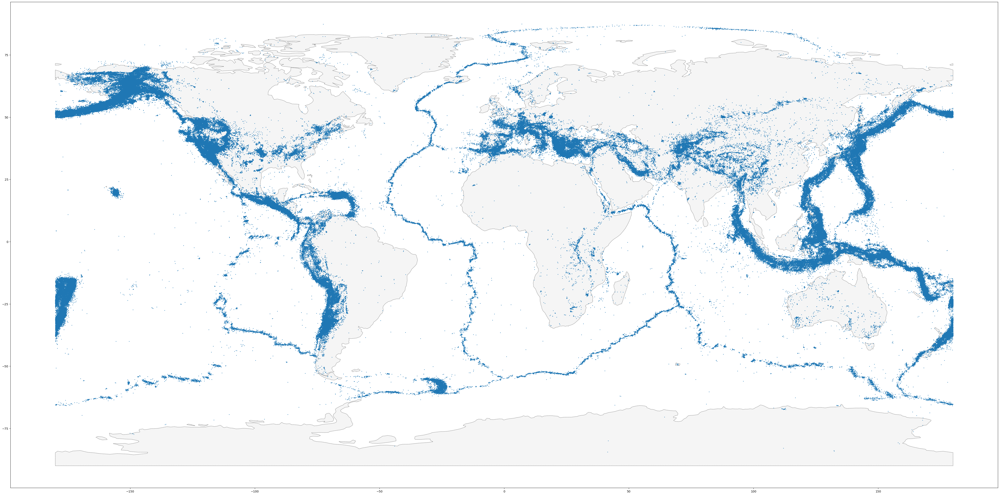

In [4]:
earthquakes = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude))
earthquakes.crs = 'EPSG:4326'

path = geodatasets.get_path('naturalearth.land')
world = gpd.read_file(path)

ax = world.plot(figsize=(60, 60), color='whitesmoke', linestyle=':', edgecolor='black')
earthquakes.to_crs(epsg=4326).plot(markersize=1, ax=ax)
plt.show()

In [5]:
df["region"] = df.place.str.split(", ", expand=True)[1]
df.region = df.region.fillna(df.place)
df.region = df.region.replace({"CA": "California", "B.C.": "Baja California"})

df = df[["depth", "mag", "region", "latitude", "longitude"]]

In [6]:
regions = df.region.value_counts()
top_k = 25
top_k_regions = regions.head(top_k).index
df = df.loc[df.region.isin(top_k_regions)]

df = df.groupby("region").resample("d").mean()
df = df.reset_index()
df.head()

,region,time,depth,mag,latitude,longitude
0,Alaska,1994-01-01 00:00:00+00:00,74.540000,3.100000,60.250980,-152.811640
1,Alaska,1994-01-02 00:00:00+00:00,61.183333,2.366667,60.914383,-150.188400
2,Alaska,1994-01-03 00:00:00+00:00,27.942857,1.990476,62.789643,-149.244229
3,Alaska,1994-01-04 00:00:00+00:00,50.640000,2.393333,60.305067,-127.430487
4,Alaska,1994-01-05 00:00:00+00:00,51.933333,2.538889,61.675750,-151.244972


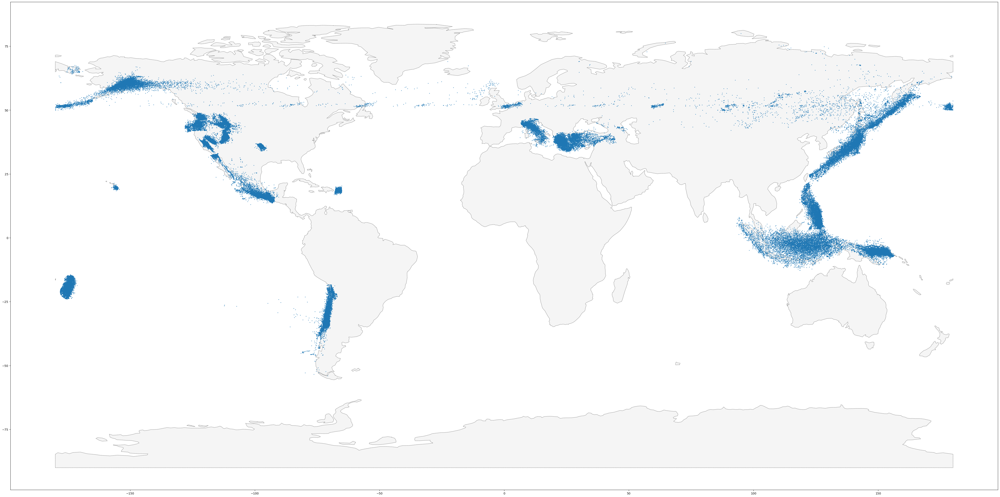

In [7]:
earthquakes = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude))
earthquakes.crs = 'EPSG:4326'

path = geodatasets.get_path('naturalearth.land')
world = gpd.read_file(path)

ax = world.plot(figsize=(60, 60), color='whitesmoke', linestyle=':', edgecolor='black')
earthquakes.to_crs(epsg=4326).plot(markersize=1, ax=ax)
plt.show()

In [8]:
df.mag = df.groupby('region').mag.ffill()
df.depth = df.groupby('region').depth.ffill()
df.latitude = df.groupby('region').latitude.ffill()
df.longitude = df.groupby('region').longitude.ffill()

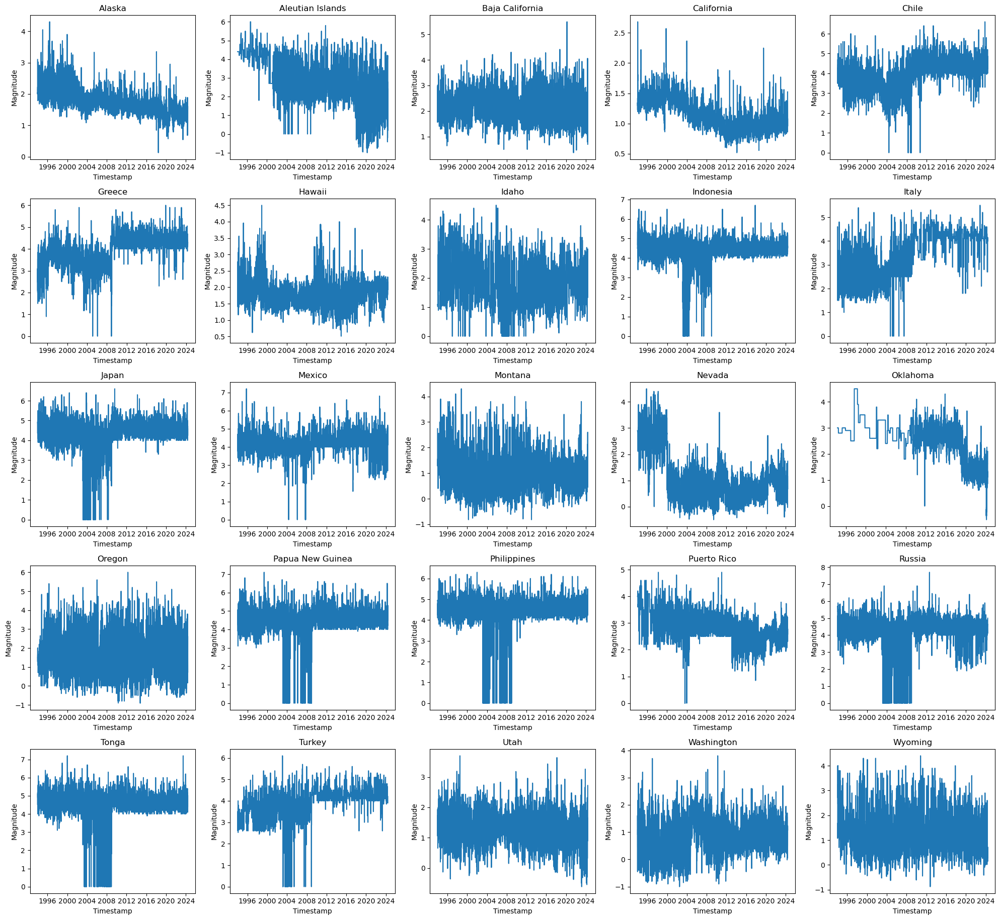

In [9]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20), sharex=False, sharey=False)

regions = df['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]
    ax.plot(region_data['time'], region_data['mag'])
    ax.set_title(regions[i])
    ax.set_xlabel('Timestamp')
    ax.set_ylabel('Magnitude')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

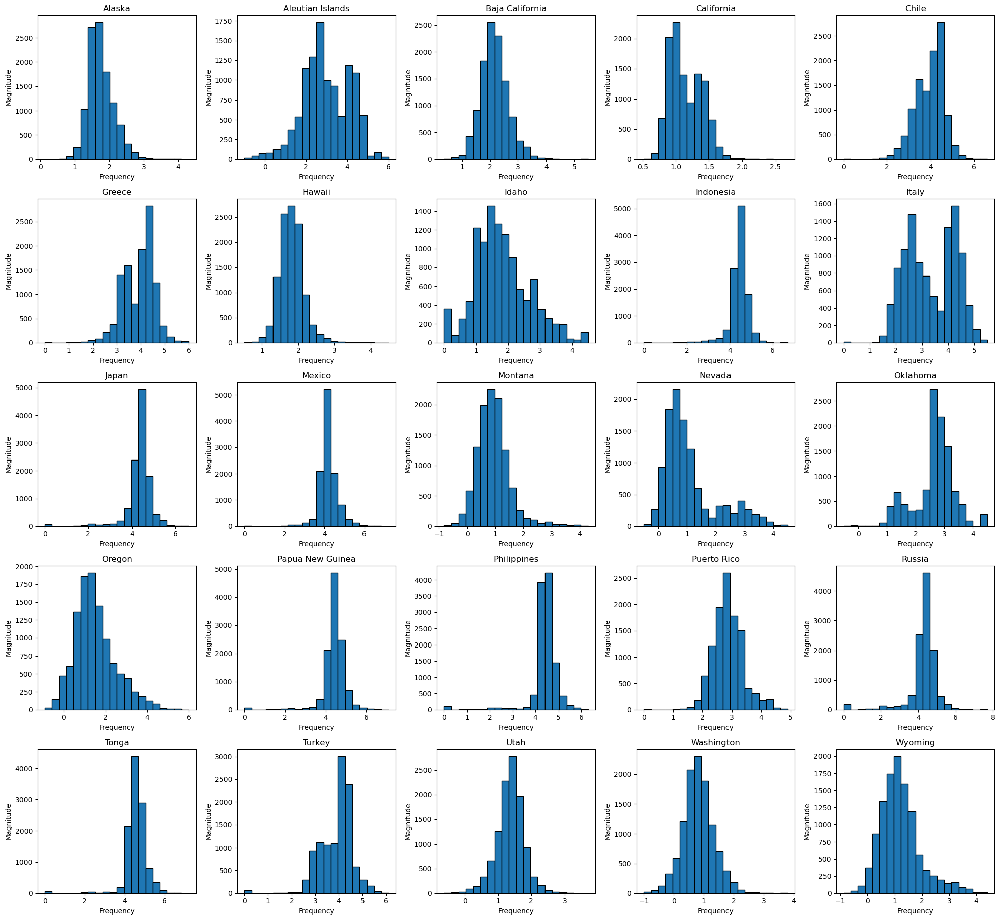

In [10]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20), sharex=False, sharey=False)

regions = df['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]
    ax.hist(region_data['mag'], bins=20, edgecolor='black')
    ax.set_title(regions[i])
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Magnitude')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

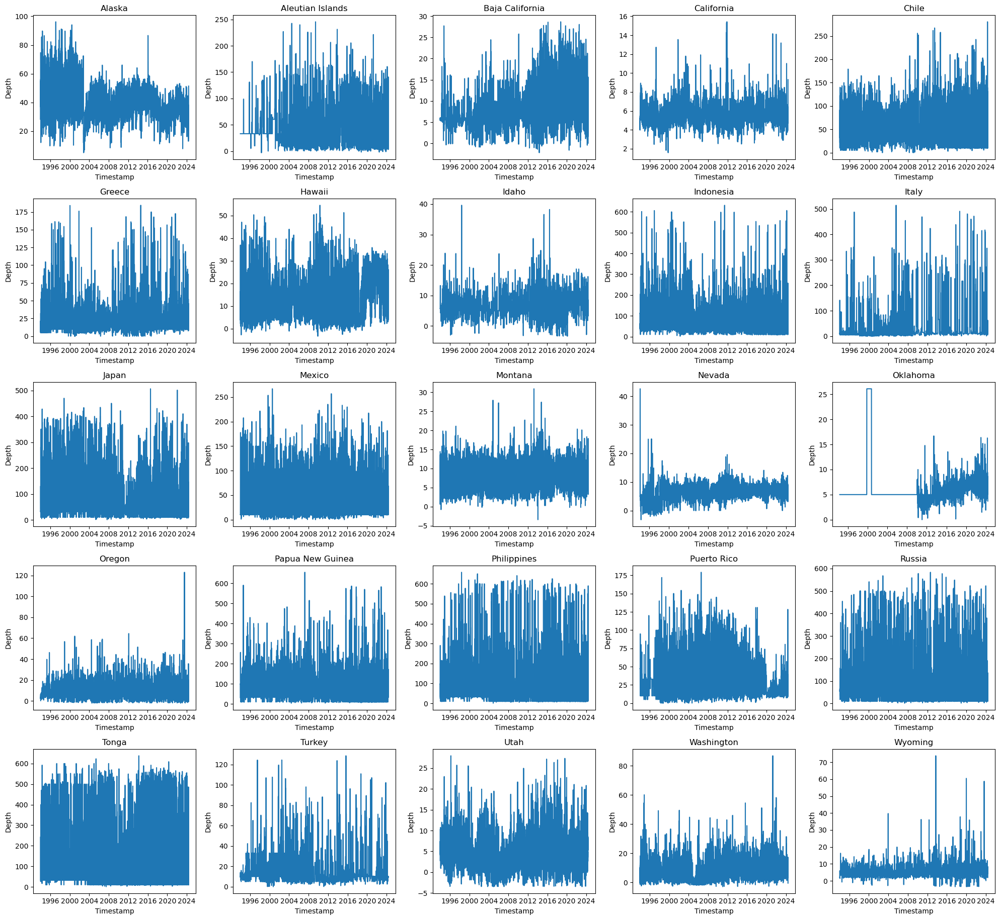

In [11]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20), sharex=False, sharey=False)

regions = df['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]
    ax.plot(region_data['time'], region_data['depth'])
    ax.set_title(regions[i])
    ax.set_xlabel('Timestamp')
    ax.set_ylabel('Depth')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

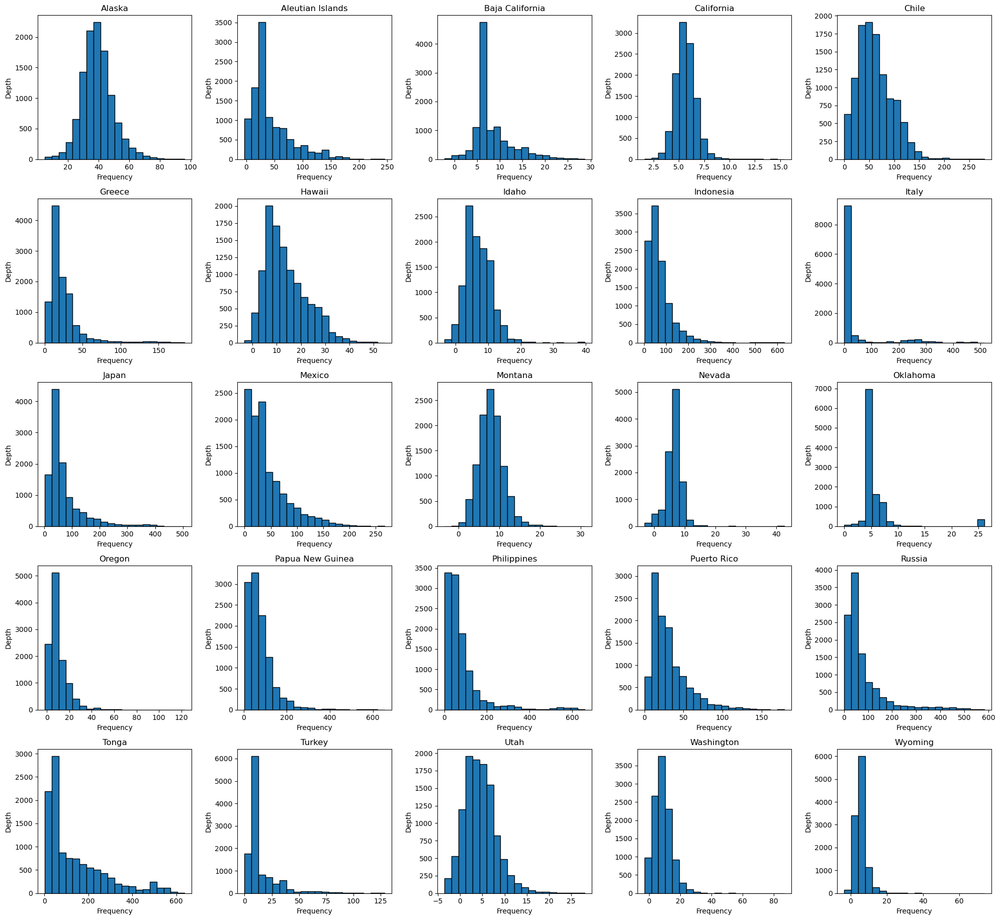

In [12]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20), sharex=False, sharey=False)

regions = df['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]
    ax.hist(region_data['depth'], bins=20, edgecolor='black')
    ax.set_title(regions[i])
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Depth')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

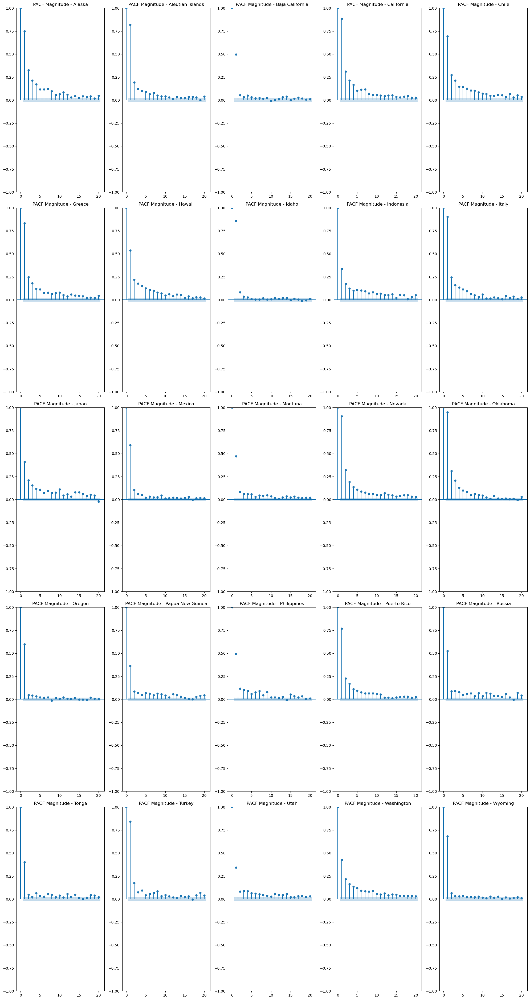

In [13]:
fig, axes = plt.subplots(5, 5, figsize=(20, 40), sharex=False, sharey=False)

regions = df['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]['mag']
    plot_pacf(region_data, lags=20, ax=ax, title=f'PACF Magnitude - {regions[i]}')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

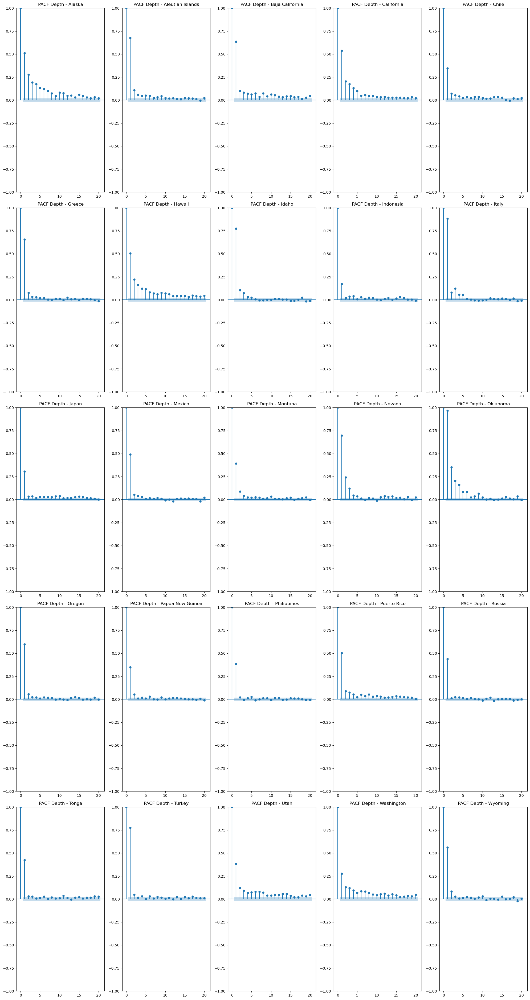

In [14]:
fig, axes = plt.subplots(5, 5, figsize=(20, 40), sharex=False, sharey=False)

regions = df['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]['depth']
    plot_pacf(region_data, lags=20, ax=ax, title=f'PACF Depth - {regions[i]}')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

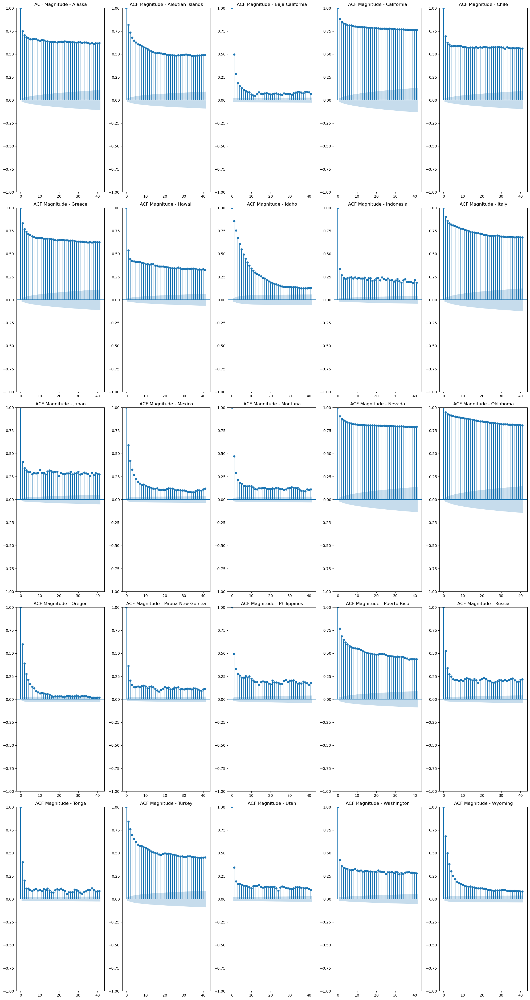

In [15]:
fig, axes = plt.subplots(5, 5, figsize=(20, 40), sharex=False, sharey=False)

for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]['mag']
    plot_acf(region_data, ax=ax, title=f'ACF Magnitude - {regions[i]}')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

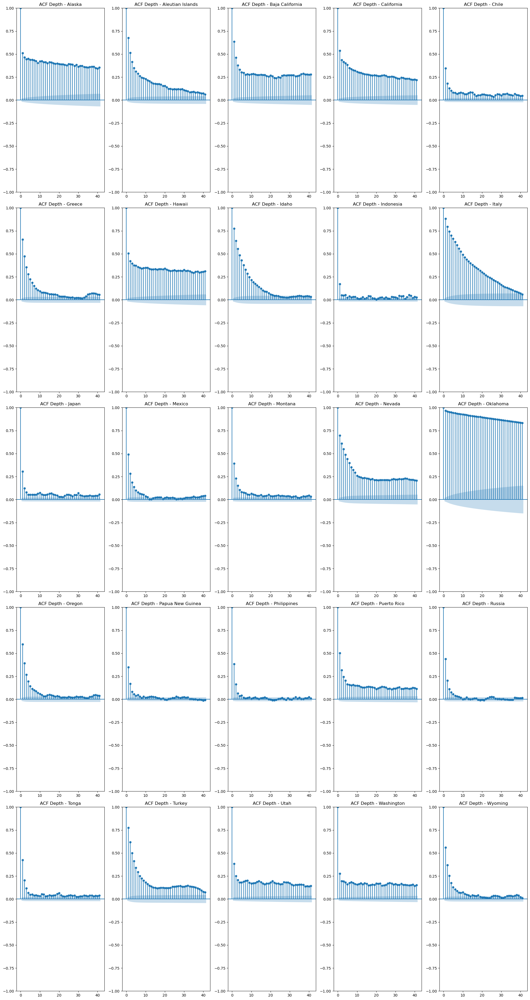

In [16]:
fig, axes = plt.subplots(5, 5, figsize=(20, 40), sharex=False, sharey=False)

for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]['depth']
    plot_acf(region_data, ax=ax, title=f'ACF Depth - {regions[i]}')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

In [17]:
def plot_periodogram(ts, region, col, detrend='linear', ax=None):
    fs = pd.Timedelta("365D") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title(f"{col} Periodogram - {region}")
    return ax

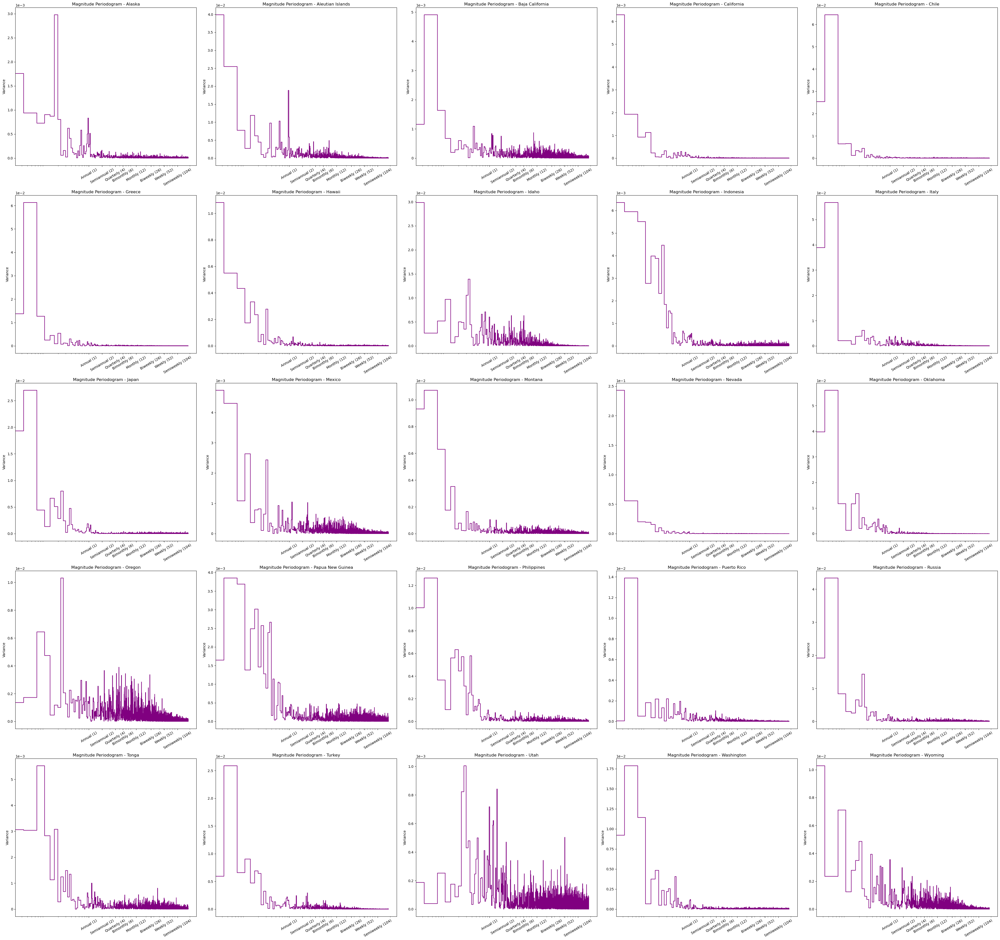

In [18]:
fig, axes = plt.subplots(5, 5, figsize=(40, 40), sharex=False, sharey=False)

for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]['mag']
    plot_periodogram(region_data, region=regions[i], col='Magnitude', ax=ax)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

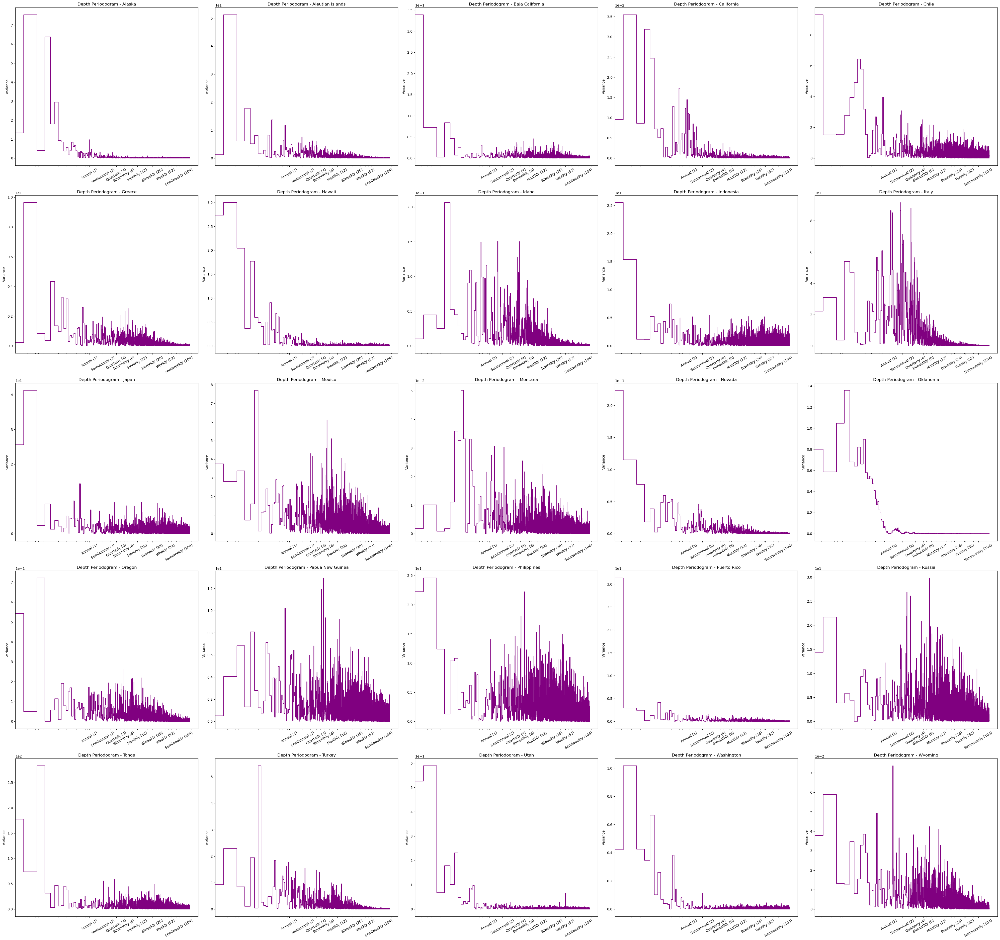

In [19]:
fig, axes = plt.subplots(5, 5, figsize=(40, 40), sharex=False, sharey=False)

for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]['depth']
    plot_periodogram(region_data, region=regions[i], col='Depth', ax=ax)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

In [20]:
df["day"] = df.time.dt.day
df["dayofweek"] = df.time.dt.dayofweek
df["dayofyear"] = df.time.dt.dayofyear

start_lag = 1
end_lag = 7
for i in range(start_lag, end_lag + 1):
    df[f"mag_lag_{i}"] = df.groupby("region").mag.shift(i)

for i in range(start_lag, end_lag + 1):
    df[f"depth_lag_{i}"] = df.groupby("region").depth.shift(i)

df['mag_ewma'] = df.groupby('region')['mag'].transform(lambda x: x.ewm(span=7, adjust=False).mean())
df['depth_ewma'] = df.groupby('region')['depth'].transform(lambda x: x.ewm(span=7, adjust=False).mean())

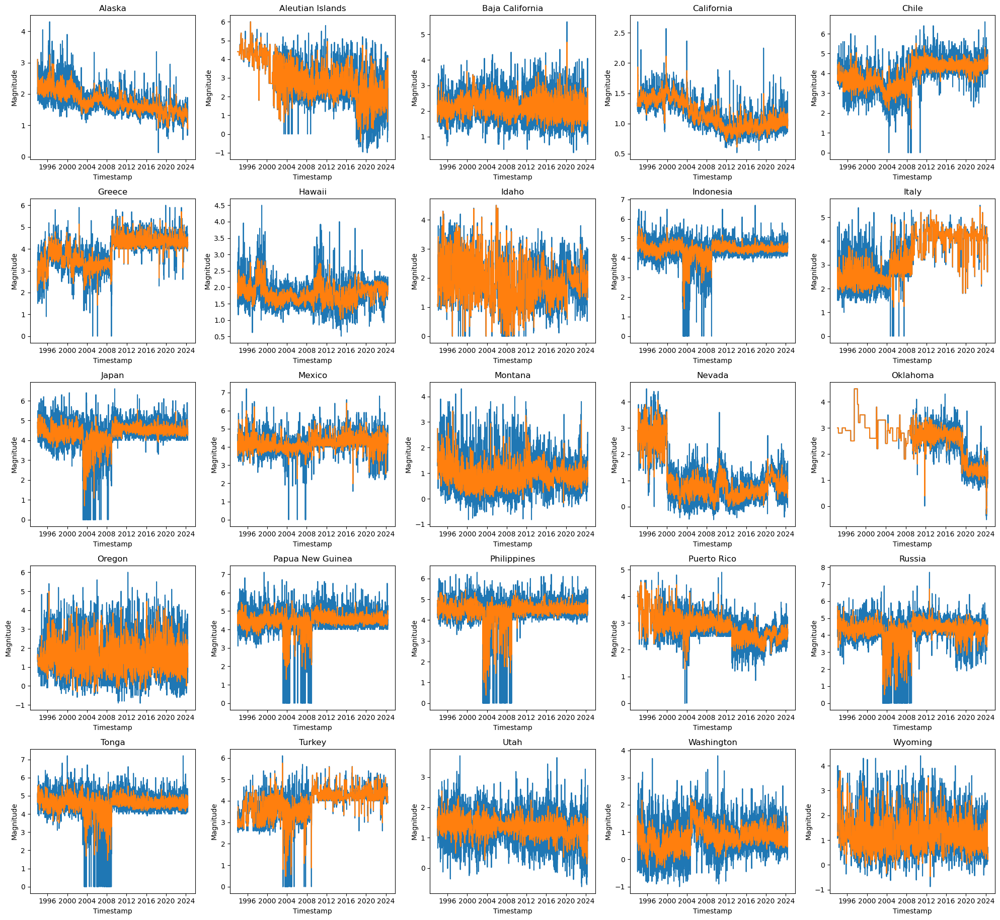

In [21]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20), sharex=False, sharey=False)

regions = df['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]
    ax.plot(region_data['time'], region_data['mag'], label='Actual')
    ax.plot(region_data['time'], region_data['mag_ewma'], label='Forecast')
    ax.set_title(regions[i])
    ax.set_xlabel('Timestamp')
    ax.set_ylabel('Magnitude')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

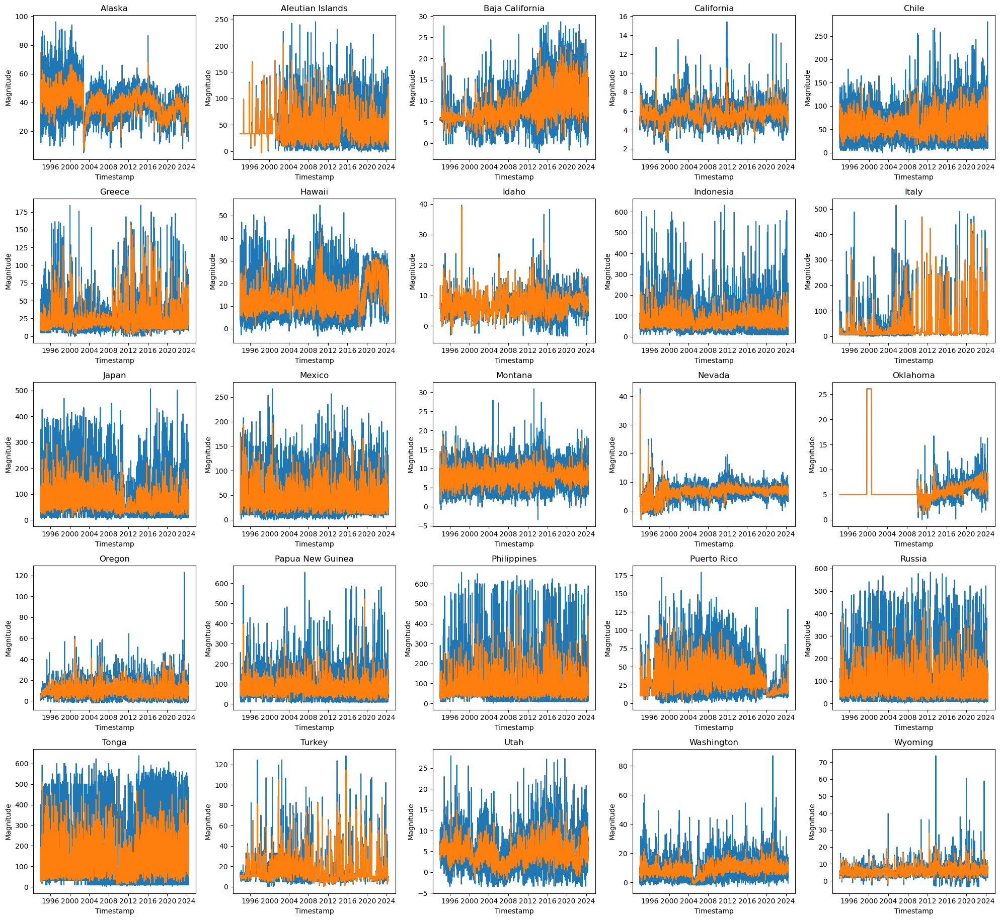

In [22]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20), sharex=False, sharey=False)

regions = df['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df[df['region'] == regions[i]]
    ax.plot(region_data['time'], region_data['depth'], label='Actual')
    ax.plot(region_data['time'], region_data['depth_ewma'], label='Forecast')
    ax.set_title(regions[i])
    ax.set_xlabel('Timestamp')
    ax.set_ylabel('Magnitude')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [23]:
features = (
    [
        "day",
        "dayofweek",
        "dayofyear",
        "mag_ewma",
        "depth_ewma",
    ]
    + [f"mag_lag_{i}" for i in range(start_lag, end_lag + 1)]
    + [f"depth_lag_{i}" for i in range(start_lag, end_lag + 1)]
)
cat_features = ["region"]
target = ["mag", "depth"]

In [24]:
df = df.sort_values(by=['region', 'time'])

In [25]:
grouped = df.groupby('region')

train_list = []
test_list = []
for name, group in grouped:
    n = len(group)
    test_size = 0.2
    split_index = int(n * (1 - test_size))

    train_list.append(group.iloc[:split_index])
    test_list.append(group.iloc[split_index:])

# Combine the training and test sets
df_train = pd.concat(train_list)
df_test = pd.concat(test_list)

In [26]:
df_train.head()

,region,time,depth,mag,latitude,longitude,day,dayofweek,dayofyear,mag_lag_1,...,mag_lag_7,depth_lag_1,depth_lag_2,depth_lag_3,depth_lag_4,depth_lag_5,depth_lag_6,depth_lag_7,mag_ewma,depth_ewma
0,Alaska,1994-01-01 00:00:00+00:00,74.540000,3.100000,60.250980,-152.811640,1,5,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.100000,74.540000
1,Alaska,1994-01-02 00:00:00+00:00,61.183333,2.366667,60.914383,-150.188400,2,6,2,3.100000,...,NaN,74.540000,NaN,NaN,NaN,NaN,NaN,NaN,2.916667,71.200833
2,Alaska,1994-01-03 00:00:00+00:00,27.942857,1.990476,62.789643,-149.244229,3,0,3,2.366667,...,NaN,61.183333,74.540000,NaN,NaN,NaN,NaN,NaN,2.685119,60.386339
3,Alaska,1994-01-04 00:00:00+00:00,50.640000,2.393333,60.305067,-127.430487,4,1,4,1.990476,...,NaN,27.942857,61.183333,74.540000,NaN,NaN,NaN,NaN,2.612173,57.949754
4,Alaska,1994-01-05 00:00:00+00:00,51.933333,2.538889,61.675750,-151.244972,5,2,5,2.393333,...,NaN,50.640000,27.942857,61.183333,74.54,NaN,NaN,NaN,2.593852,56.445649


In [27]:
df_train = df_train.dropna()

In [28]:
df_test.head()

,region,time,depth,mag,latitude,longitude,day,dayofweek,dayofyear,mag_lag_1,...,mag_lag_7,depth_lag_1,depth_lag_2,depth_lag_3,depth_lag_4,depth_lag_5,depth_lag_6,depth_lag_7,mag_ewma,depth_ewma
8883,Alaska,2018-04-28 00:00:00+00:00,42.858264,1.532810,60.474846,-152.538592,28,5,118,1.317391,...,1.543900,30.035826,32.001379,36.188617,34.956400,42.852344,42.852344,30.139200,1.514149,36.455688
8884,Alaska,2018-04-29 00:00:00+00:00,37.141417,1.628898,60.000803,-153.438751,29,6,119,1.532810,...,1.517813,42.858264,30.035826,32.001379,36.188617,34.956400,42.852344,42.852344,1.542836,36.627120
8885,Alaska,2018-04-30 00:00:00+00:00,33.499030,1.641493,58.925755,-154.280734,30,0,120,1.628898,...,1.517813,37.141417,42.858264,30.035826,32.001379,36.188617,34.956400,42.852344,1.567500,35.845098
8886,Alaska,2018-05-01 00:00:00+00:00,40.155179,1.425446,59.422451,-152.065312,1,1,121,1.641493,...,1.531600,33.499030,37.141417,42.858264,30.035826,32.001379,36.188617,34.956400,1.531987,36.922618
8887,Alaska,2018-05-02 00:00:00+00:00,34.204464,1.548125,59.813091,-153.400697,2,2,122,1.425446,...,1.520000,40.155179,33.499030,37.141417,42.858264,30.035826,32.001379,36.188617,1.536021,36.243080


In [29]:
model = cb.CatBoostRegressor(
    early_stopping_rounds=20,
    cat_features=cat_features,
    loss_function="MultiRMSE",
)

X = df_train[features + cat_features]
y = df_train[target]

grid = {
    'learning_rate': [0.01, 0.03, 0.1],
    'depth': [4, 6, 10],
    'l2_leaf_reg': [1, 3, 5, 7, 9],
}

grid_search_result = model.grid_search(grid, X, y)

0:	learn: 67.4611822	test: 68.4891181	best: 68.4891181 (0)	total: 81.2ms	remaining: 1m 21s
1:	learn: 66.9734669	test: 67.9935552	best: 67.9935552 (1)	total: 98.2ms	remaining: 49s
2:	learn: 66.4918400	test: 67.5058265	best: 67.5058265 (2)	total: 118ms	remaining: 39.3s
3:	learn: 66.0237697	test: 67.0323987	best: 67.0323987 (3)	total: 138ms	remaining: 34.4s
4:	learn: 65.5552016	test: 66.5625339	best: 66.5625339 (4)	total: 157ms	remaining: 31.3s
5:	learn: 65.0911925	test: 66.0998358	best: 66.0998358 (5)	total: 174ms	remaining: 28.8s
6:	learn: 64.6327524	test: 65.6357801	best: 65.6357801 (6)	total: 190ms	remaining: 26.9s
7:	learn: 64.1776771	test: 65.1756867	best: 65.1756867 (7)	total: 206ms	remaining: 25.5s
8:	learn: 63.7292738	test: 64.7196891	best: 64.7196891 (8)	total: 222ms	remaining: 24.5s
9:	learn: 63.2851418	test: 64.2698917	best: 64.2698917 (9)	total: 240ms	remaining: 23.7s
10:	learn: 62.8521117	test: 63.8298200	best: 63.8298200 (10)	total: 261ms	remaining: 23.5s
11:	learn: 62.4185

In [30]:
grid_search_result['params']

{'depth': 10, 'learning_rate': 0.1, 'l2_leaf_reg': 5}

In [31]:
prediction = model.predict(df_test[features + cat_features])
print(f"Mean Absolute Error: {mean_absolute_error(df_test[target], prediction)}")
print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(df_test[target], prediction))}")

r2 = r2_score(df_test[target], prediction)
print(f"R2 Score: {r2}")

# Number of observations
n = X.shape[0]

# Number of predictors
p = X.shape[1]

# Calculate adjusted R^2 score
adjusted_r2 = 1 - ((1 - r2) * (n - 1)) / (n - p - 1)

print(f'Adjusted R2: {adjusted_r2}')

Mean Absolute Error: 2.9344104235566153
Root Mean Squared Error: 10.35774285263063
R2 Score: 0.9494547248410752
Adjusted R2: 0.9494501643308314


In [32]:
df_forecast = pd.DataFrame(prediction, columns=["mag_forecast", "depth_forecast"])
df_test = df_test.reset_index()
df_test = df_test.join(df_forecast)

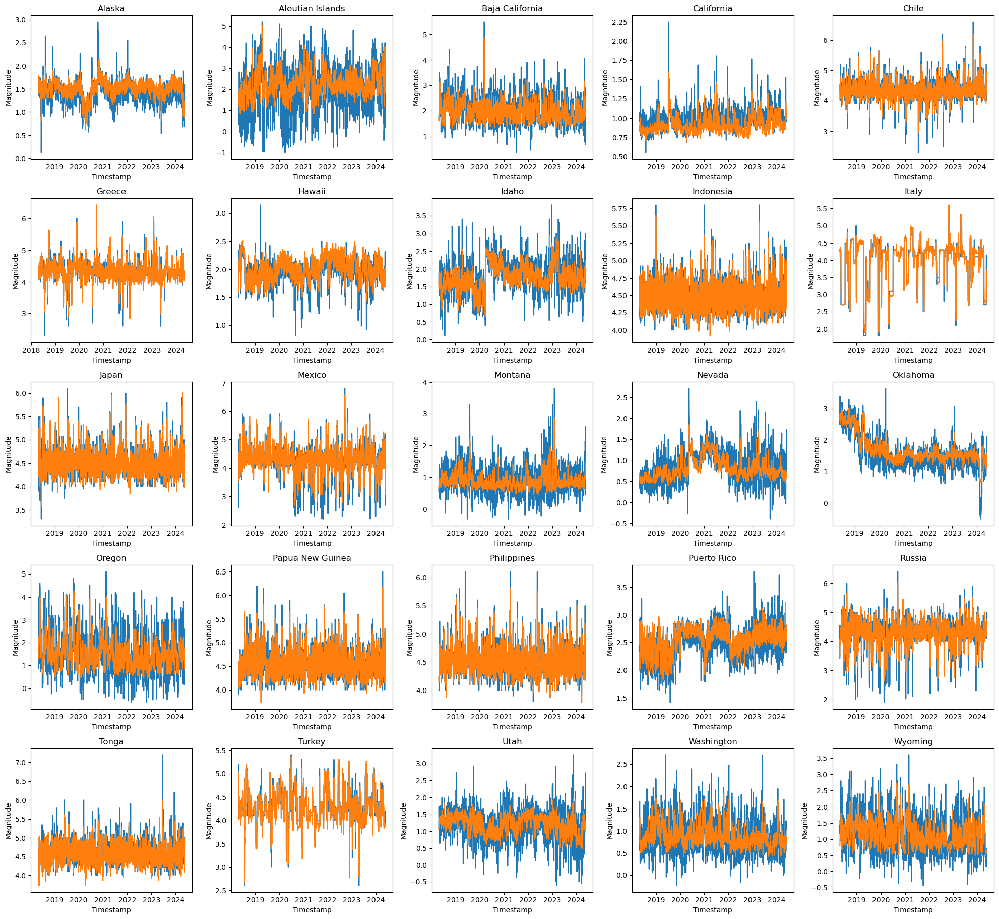

In [33]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20), sharex=False, sharey=False)

regions = df_test['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df_test[df_test['region'] == regions[i]]
    ax.plot(region_data['time'], region_data['mag'], label='Actual')
    ax.plot(region_data['time'], region_data['mag_forecast'], label='Forecast')
    ax.set_title(regions[i])
    ax.set_xlabel('Timestamp')
    ax.set_ylabel('Magnitude')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

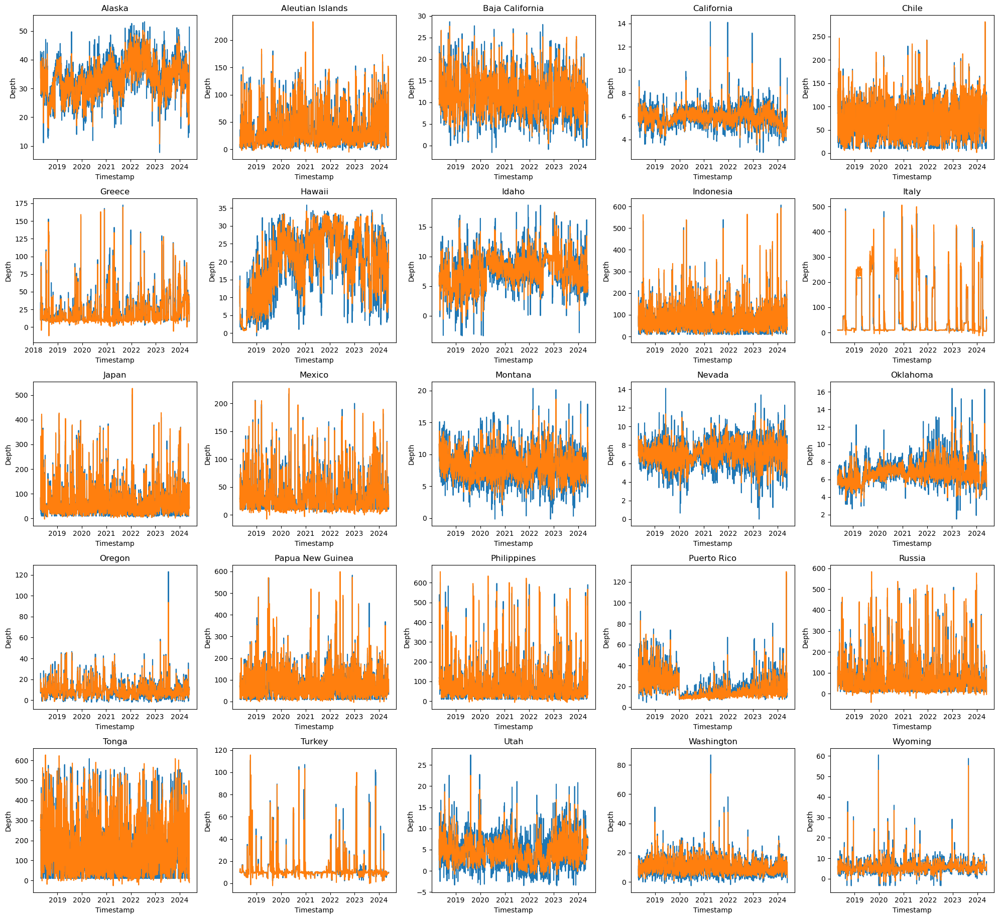

In [34]:
fig, axes = plt.subplots(5, 5, figsize=(20, 20), sharex=False, sharey=False)

regions = df_test['region'].unique()
for i, ax in enumerate(axes.flat):
    region_data = df_test[df_test['region'] == regions[i]]
    ax.plot(region_data['time'], region_data['depth'], label='Actual')
    ax.plot(region_data['time'], region_data['depth_forecast'], label='Forecast')
    ax.set_title(regions[i])
    ax.set_xlabel('Timestamp')
    ax.set_ylabel('Depth')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

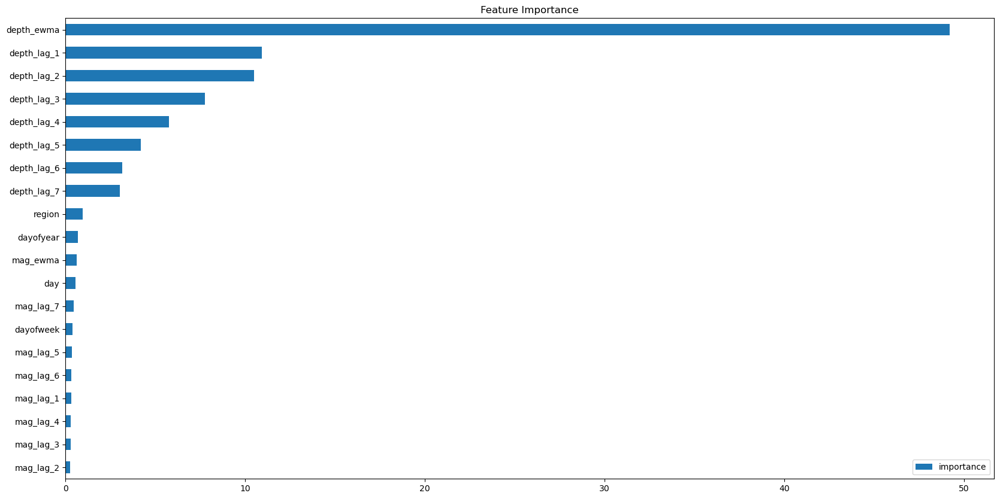

In [35]:
fi = pd.DataFrame(data=model.get_feature_importance(), index=model.feature_names_, columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance', figsize=(20, 10))
plt.show()

In [37]:
model.save_model('forecasting_model')